In [3]:
import pandas as pd
import geopandas as gpd
import plotly.graph_objects as go
import json
import numpy as np
import plotly.express as px 

In [28]:
county = "Dallas"

diabetes_df = pd.read_csv(
    f"../diabetes_data/diabetes_cleaned_csv/{county}_diabetes_data.csv",
    dtype={'TractFIPS': str}
)
chd_df = pd.read_csv(f"/users/ctlin/fooddesertproject/health_data/CHD_data/CHD_csv/{county}_CHD_data.csv", dtype={'TractFIPS': str})

In [29]:
df = diabetes_df.merge(chd_df[['TractFIPS', 'CHD_CrudePrev']], on='TractFIPS', how='inner')

In [30]:
# calculates percentile. so the number of tracts with a lower prevelance percentage/total number of tracts so we can find where that tract stands amongst the county
df['diabetes_pct_rank'] = df['DIABETES_CrudePrev'].rank(pct=True)
df['chd_pct_rank'] = df['CHD_CrudePrev'].rank(pct=True)

# take the average of these new percentile ranking
df['raw_composite_rank'] = (df['diabetes_pct_rank'] + df['chd_pct_rank']) / 2

# averages tend to cluster around the middle, so we apply the same logic above and compare their percentage to the rest of the tracts to make a more uniform distribution 
df['final_health_composite'] = df['raw_composite_rank'].rank(pct=True)

df.to_csv(f"{county}_health_composite_score.csv")

In [21]:
df['TractFIPS'] = df['TractFIPS'].str.zfill(11)

shapefile_path = "../../Census_Tract/tl_2025_48_tract.shp"   
gdf = gpd.read_file(shapefile_path)

# need to change county code here (FIPS code) 
# this is the link with the codes: https://www.dshs.texas.gov/center-health-statistics/texas-county-numbers-public-health-regions
county_gdf = gdf[gdf["COUNTYFP"] == "201"].copy() 

final_county_gdf = county_gdf.to_crs(epsg=4326)

# find the center of the county 
centroid = final_county_gdf.geometry.union_all().centroid
print(centroid.y, centroid.x) 

29.857306611688376 -95.39226044799751


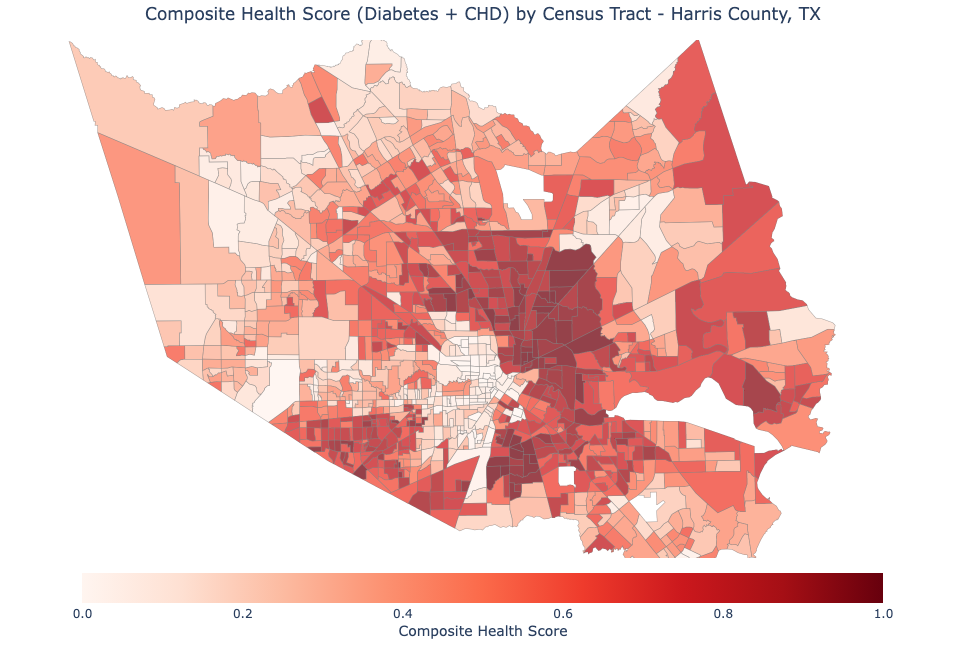

In [22]:
geojson_data = json.loads(final_county_gdf.to_json())

fig = px.choropleth_map(
    df,
    geojson=geojson_data,
    locations="TractFIPS",               
    color='final_health_composite',
    range_color=(0.0, 1.0),          
    color_continuous_scale="Reds",
    featureidkey="properties.GEOID",     
    map_style="white-bg",      
    zoom=9,
    opacity=0.75,
    
    # need to change coordinates based on calculation above 
    center={"lat": 29.857306611688376, "lon":-95.39226044799751},   
    
    title=f"Composite Health Score (Diabetes + CHD) by Census Tract - {county} County, TX",
)

fig.update_traces(
    marker_line_width=0.5,
    marker_line_color='#888888',
)

fig.update_layout(
    width=900,
    height=650,
    margin={"r": 0, "t": 40, "l": 0, "b": 0},
    title={'xanchor': 'center', 'x': 0.5},
    coloraxis_colorbar={
        'title': "Composite Health Score",
        'title_side': 'bottom',
        'tickformat': '.1f',
        'orientation': 'h',
        'x': 0.5,
        'xanchor': 'center',
        'y': -0.01,
        'yanchor': 'top',
        'len': 0.85,
    },
)

fig.show()